# Import Data, Storage, Library

In [ ]:
from google.colab import drive
drive.mount("/content/drive/")
%cd "/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan"

Mounted at /content/drive/
/content/drive/.shortcut-targets-by-id/19WB1Ohri0T4iAv3l5rvluYoFBaNzInRN/Dataset/UTC2@iLabs_Training/Trong_Nhan


In [ ]:
import numpy as np, pandas as pd
from glob import glob
import shutil, os
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupKFold
from tqdm.notebook import tqdm
import seaborn as sns
dim = 512 #512, 256, 'original'
fold = 4

In [ ]:
train_df = pd.read_csv("/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/train.csv")
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072


In [ ]:
train_df['image_path'] = f'/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/train/'+train_df.image_id+('.png' if dim!='original' else '.jpg')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,2332,2580,/content/drive/Shareddrives/Google Drive Unlim...
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,2954,3159,/content/drive/Shareddrives/Google Drive Unlim...
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,/content/drive/Shareddrives/Google Drive Unlim...
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,/content/drive/Shareddrives/Google Drive Unlim...
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,2540,3072,/content/drive/Shareddrives/Google Drive Unlim...


# Data Clean

In [ ]:
train_df = train_df[train_df.class_id!=14].reset_index(drop = True)

In [ ]:
train_df

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,/content/drive/Shareddrives/Google Drive Unlim...
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,/content/drive/Shareddrives/Google Drive Unlim...
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0,2540,3072,/content/drive/Shareddrives/Google Drive Unlim...
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0,2285,2555,/content/drive/Shareddrives/Google Drive Unlim...
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0,2568,3353,/content/drive/Shareddrives/Google Drive Unlim...
...,...,...,...,...,...,...,...,...,...,...,...
36091,b53d1dd80e99ca6bcef9d592f65d3321,Pleural effusion,10,R9,240.0,1550.0,562.0,2001.0,2304,2880,/content/drive/Shareddrives/Google Drive Unlim...
36092,26d1d5a0ef2e692c6340e74859ffdc53,Pulmonary fibrosis,13,R10,1163.0,787.0,1338.0,941.0,3072,3072,/content/drive/Shareddrives/Google Drive Unlim...
36093,22672ab82c290c20b86863291e25ef6c,ILD,5,R9,299.0,664.0,794.0,1508.0,2048,2500,/content/drive/Shareddrives/Google Drive Unlim...
36094,db169d0be36123bd55b866d6aa73983b,Other lesion,9,R8,6.0,670.0,272.0,1736.0,2304,2880,/content/drive/Shareddrives/Google Drive Unlim...


# Data preprocessing

In [ ]:
train_df['x_min'] = train_df.apply(lambda row: (row.x_min)/row.width, axis =1)
train_df['y_min'] = train_df.apply(lambda row: (row.y_min)/row.height, axis =1)

train_df['x_max'] = train_df.apply(lambda row: (row.x_max)/row.width, axis =1)
train_df['y_max'] = train_df.apply(lambda row: (row.y_max)/row.height, axis =1)

train_df['x_mid'] = train_df.apply(lambda row: (row.x_max+row.x_min)/2, axis =1)
train_df['y_mid'] = train_df.apply(lambda row: (row.y_max+row.y_min)/2, axis =1)

train_df['w'] = train_df.apply(lambda row: (row.x_max-row.x_min), axis =1)
train_df['h'] = train_df.apply(lambda row: (row.y_max-row.y_min), axis =1)

train_df['area'] = train_df['w']*train_df['h']
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,/content/drive/Shareddrives/Google Drive Unlim...,0.563462,0.686216,0.462500,0.195205,0.090283
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,/content/drive/Shareddrives/Google Drive Unlim...,0.623915,0.305903,0.150608,0.095833,0.014433
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,/content/drive/Shareddrives/Google Drive Unlim...,0.309843,0.128581,0.125984,0.024740,0.003117
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,/content/drive/Shareddrives/Google Drive Unlim...,0.773523,0.472407,0.368053,0.753033,0.277156
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,/content/drive/Shareddrives/Google Drive Unlim...,0.239875,0.721145,0.045950,0.039368,0.001809


In [ ]:
features = ['x_min', 'y_min', 'x_max', 'y_max', 'x_mid', 'y_mid', 'w', 'h', 'area']
X = train_df[features]
y = train_df['class_id']
X.shape, y.shape

((36096, 9), (36096,))

In [ ]:
class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
classes = list(np.array(class_names)[np.argsort(class_ids)])
classes = list(map(lambda x: str(x), classes))
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']


# Plot Datamap

In [ ]:

from sklearn.manifold import TSNE

tsne = TSNE(n_components = 2, perplexity = 40, random_state=1, n_iter=5000)
data_X = X
data_y = y.loc[data_X.index]
embs = tsne.fit_transform(data_X)
# Add to dataframe for convenience
plot_x = embs[:, 0]
plot_y = embs[:, 1]

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,


KeyboardInterrupt: ignored

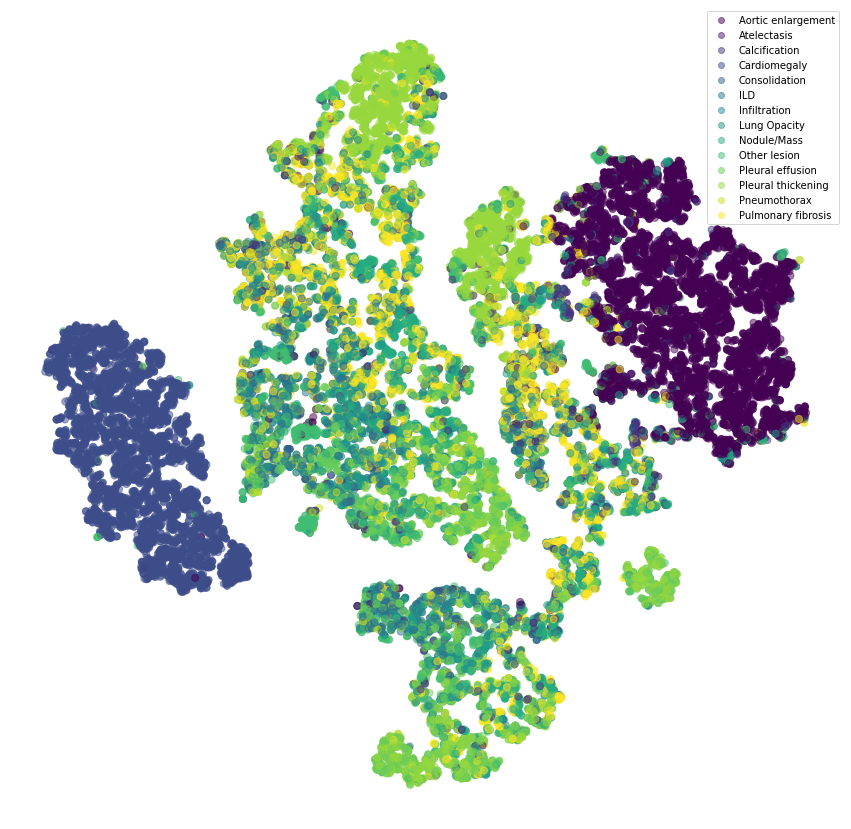

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
plt.axis('off')
scatter = plt.scatter(plot_x, plot_y, marker = 'o',s = 50, c=data_y.tolist(), alpha= 0.5,cmap='viridis')
plt.legend(handles=scatter.legend_elements()[0], labels=classes)

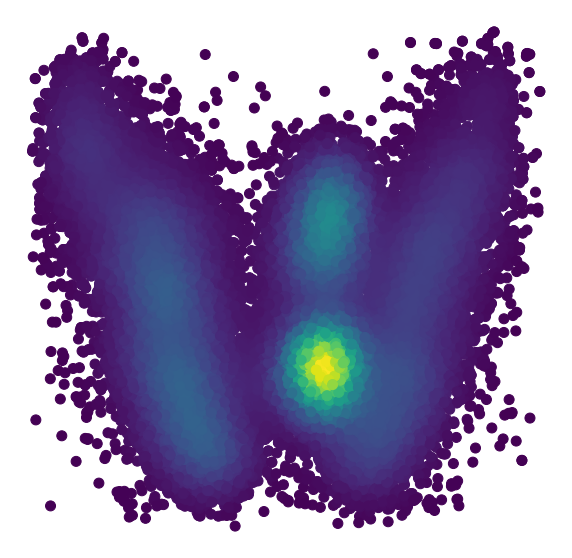

In [ ]:
from scipy.stats import gaussian_kde


x_val = train_df.x_mid.values
y_val = train_df.y_mid.values

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
ax.axis('off')
ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# ax.set_xlabel('x_mid')
# ax.set_ylabel('y_mid')
plt.show()

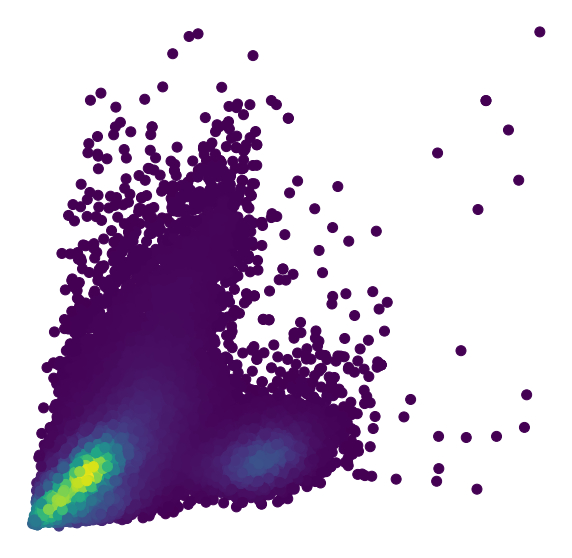

In [ ]:
x_val = train_df.w.values
y_val = train_df.h.values

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
ax.axis('off')
ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# ax.set_xlabel('bbox_width')
# ax.set_ylabel('bbox_height')
plt.show()

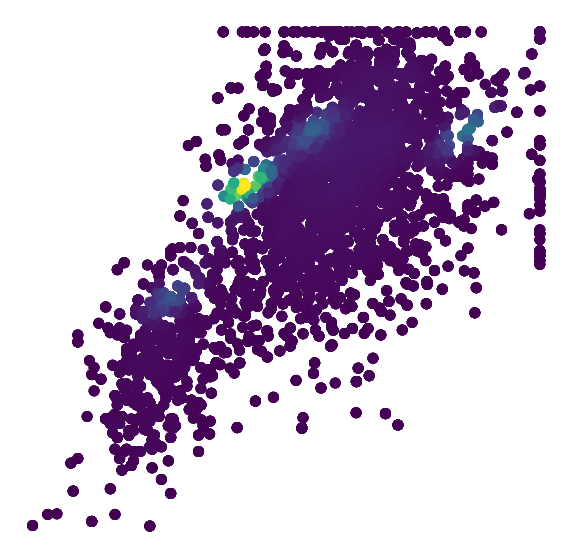

In [ ]:
x_val = train_df.width.values
y_val = train_df.height.values

# Calculate the point density
xy = np.vstack([x_val,y_val])
z = gaussian_kde(xy)(xy)

fig, ax = plt.subplots(figsize = (10, 10))
ax.axis('off')
ax.scatter(x_val, y_val, c=z, s=100, cmap='viridis')
# ax.set_xlabel('image_width')
# ax.set_ylabel('image_height')
plt.show()


# Statictis

In [ ]:
gkf  = GroupKFold(n_splits = 5)
train_df['fold'] = -1
for fold, (train_idx, val_idx) in enumerate(gkf.split(train_df, groups = train_df.image_id.tolist())):
    train_df.loc[val_idx, 'fold'] = fold
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,image_path,x_mid,y_mid,w,h,area,fold
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,/content/drive/Shareddrives/Google Drive Unlim...,0.563462,0.686216,0.462500,0.195205,0.090283,3
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,/content/drive/Shareddrives/Google Drive Unlim...,0.623915,0.305903,0.150608,0.095833,0.014433,2
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,/content/drive/Shareddrives/Google Drive Unlim...,0.309843,0.128581,0.125984,0.024740,0.003117,4
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,/content/drive/Shareddrives/Google Drive Unlim...,0.773523,0.472407,0.368053,0.753033,0.277156,2
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,/content/drive/Shareddrives/Google Drive Unlim...,0.239875,0.721145,0.045950,0.039368,0.001809,4


In [ ]:
train_files = []
val_files   = []
val_files += list(train_df[train_df.fold==fold].image_path.unique())
train_files += list(train_df[train_df.fold!=fold].image_path.unique())
len(train_files), len(val_files)

(3515, 879)

In [ ]:
train_df.to_csv("train_df.csv")

In [ ]:
train_df = pd.read_csv("train_df.csv")

In [ ]:
os.makedirs('/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/labels/train', exist_ok = True)
os.makedirs('/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/labels/val', exist_ok = True)
os.makedirs('/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/images/train', exist_ok = True)
os.makedirs('/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/images/val', exist_ok = True)
label_dir = '/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/yololabel/labels'
for file in tqdm(train_files):
    shutil.copy(file, '/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/images/train')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(label_dir, filename+'.txt'), '/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/labels/train')
    
for file in tqdm(val_files):
    shutil.copy(file, '/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/images/val')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(label_dir, filename+'.txt'), '/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/labels/val')

  0%|          | 0/3515 [00:00<?, ?it/s]

  0%|          | 0/879 [00:00<?, ?it/s]

In [ ]:
class_ids, class_names = list(zip(*set(zip(train_df.class_id, train_df.class_name))))
classes = list(np.array(class_names)[np.argsort(class_ids)])
classes = list(map(lambda x: str(x), classes))
classes

['Aortic enlargement',
 'Atelectasis',
 'Calcification',
 'Cardiomegaly',
 'Consolidation',
 'ILD',
 'Infiltration',
 'Lung Opacity',
 'Nodule/Mass',
 'Other lesion',
 'Pleural effusion',
 'Pleural thickening',
 'Pneumothorax',
 'Pulmonary fibrosis']

# Pre-trained Model

In [ ]:
!pip install -U PyYAML
from os import listdir
from os.path import isfile, join
import yaml

cwd = '/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata'

with open(join( cwd , 'train.txt'), 'w') as f:
    for path in glob('/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/images/train/*'):
        f.write(path+'\n')
            
with open(join( cwd , 'val.txt'), 'w') as f:
    for path in glob('/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/images/val/*'):
        f.write(path+'\n')

data = dict(
    train =  join( cwd , 'train.txt') ,
    val   =  join( cwd , 'val.txt' ),
    nc    = 14,
    names = classes
    )

with open(join( cwd , 'vinbigdata.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(join( cwd , 'vinbigdata.yaml'), 'r')
print('\nyaml:')
print(f.read())

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 596 kB 13.9 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13

yaml:
names:
- Aortic enlargement
- Atelectasis
- Calcification
- Cardiomegaly
- Consolidation
- ILD
- Infiltration
- Lung Opacity
- Nodule/Mass
- Other lesion
- Pleural effusion
- Pleural thickening
- Pneumothorax
- Pulmonary fibrosis
nc: 14
train: /content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/train.txt
val: /content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/val.txt



In [ ]:
# https://www.kaggle.com/ultralytics/yolov5
# !git clone https://github.com/ultralytics/yolov5  # clone repo
# %cd yolov5
# shutil.copytree('/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/yolov5', '/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/yolo')
# os.chdir('/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/')
# # %pip install -qr requirements.txt # install dependencies
!pip install torch==1.10.1+cu111 torchvision==0.11.2+cu111 torchaudio==0.10.1 -f https://download.pytorch.org/whl/torch_stable.html
import torch
from IPython.display import Image, clear_output  # to display images

clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.10.1+cu111 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15109MB, multi_processor_count=40)


# Train Models

In [ ]:
%cd "/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/yolov5"
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/

/content/drive/.shortcut-targets-by-id/19WB1Ohri0T4iAv3l5rvluYoFBaNzInRN/Dataset/UTC2@iLabs_Training/Trong_Nhan/yolov5
Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.25, device='', exist_ok=False, img_size=640, iou_thres=0.45, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='data/images/', update=False, view_img=False, weights=['yolov5s.pt'])
Using torch 1.10.1+cu111 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 232 layers, 7459581 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/2 /content/drive/.shortcut-targets-by-id/19WB1Ohri0T4iAv3l5rvluYoFBaNzInRN/Dataset/UTC2@iLabs_Training/Trong_Nhan/yolov5/data/images/bus.jpg: 640x480 

In [ ]:
Image(filename='/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/yolov5/runs/detect/exp7/zidane.jpg', width=600)

In [ ]:
# !WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov5s.pt --nosave --cache 
!WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 30 --data '/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/vinbigdata.yaml' --weights yolov5x.pt --cache

Using torch 1.10.1+cu111 CUDA:0 (Tesla T4, 15109.75MB)

Namespace(adam=False, batch_size=16, bucket='', cache_images=True, cfg='', data='/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/vinbigdata.yaml', device='', epochs=30, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[640, 640], local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='exp', noautoanchor=False, nosave=False, notest=False, project='runs/train', rect=False, resume=False, save_dir='runs/train/exp2', single_cls=False, sync_bn=False, total_batch_size=16, weights='yolov5x.pt', workers=8, world_size=1)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
Hyperparameters {'lr0': 0.01, 'lrf': 0.2, 'momentum': 0.937, 'weight_decay': 0.0005, 'warmup_epochs': 3.0, 'warmup_momentum': 0.8, 'warmup_bias_lr': 0.1, 'box': 0.05, 'cls': 0.5, 'cls_p

# Visualazation result

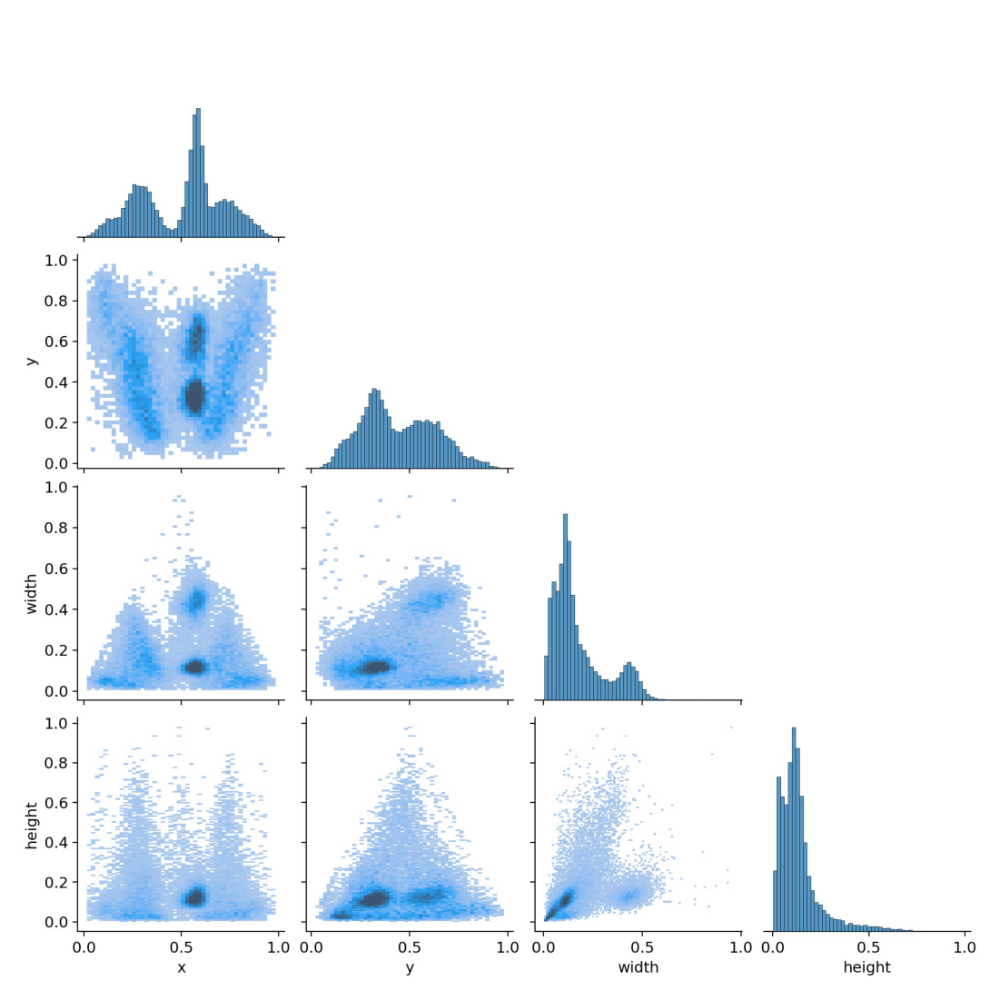

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/labels_correlogram.jpg'));

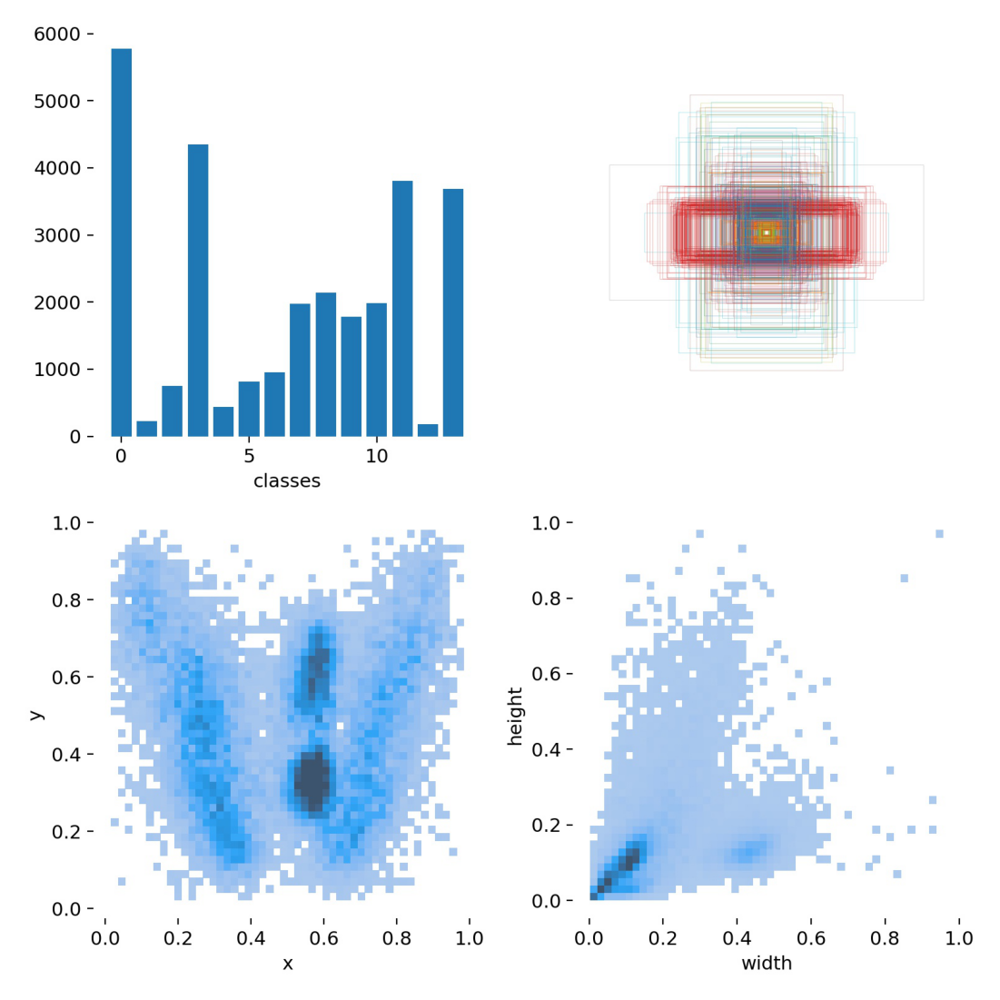

In [ ]:
plt.figure(figsize = (20,20))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/labels.jpg'));

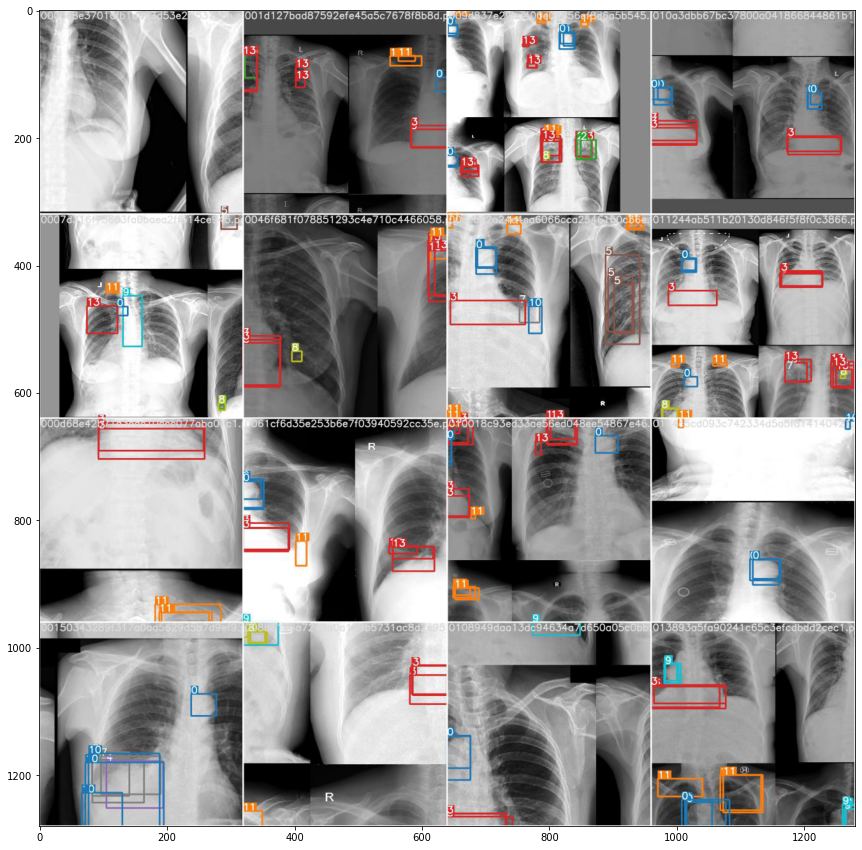

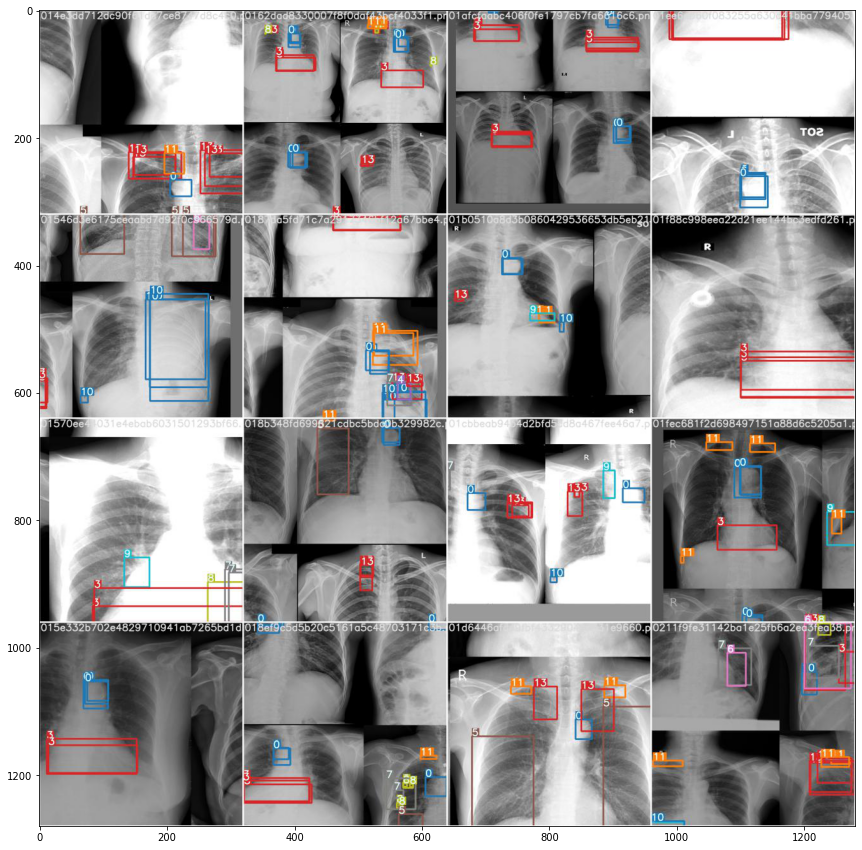

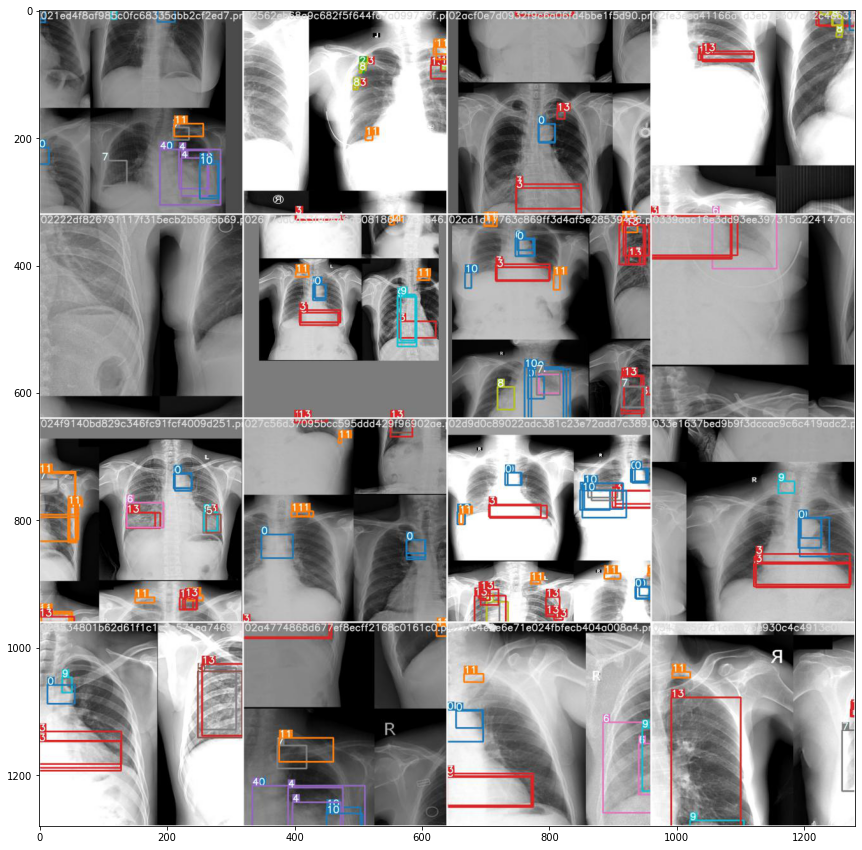

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch0.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch1.jpg'))

plt.figure(figsize = (15, 15))
plt.imshow(plt.imread('runs/train/exp/train_batch2.jpg'))

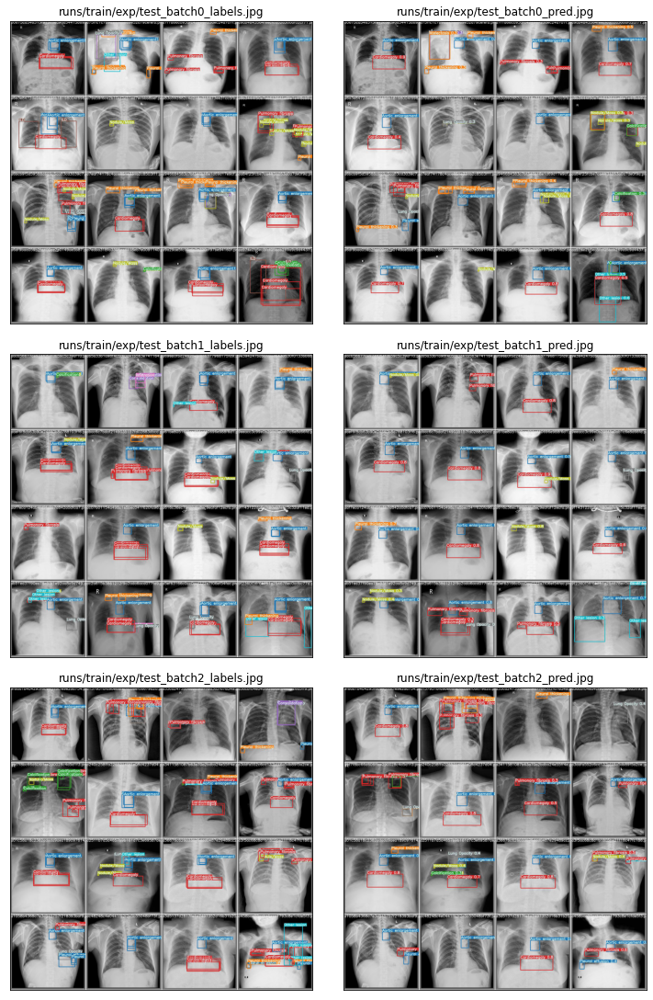

In [ ]:
fig, ax = plt.subplots(3, 2, figsize = (2*5,3*5), constrained_layout = True)
for row in range(3):
    ax[row][0].imshow(plt.imread(f'runs/train/exp/test_batch{row}_labels.jpg'))
    ax[row][0].set_xticks([])
    ax[row][0].set_yticks([])
    ax[row][0].set_title(f'runs/train/exp/test_batch{row}_labels.jpg', fontsize = 12)
    
    ax[row][1].imshow(plt.imread(f'runs/train/exp/test_batch{row}_pred.jpg'))
    ax[row][1].set_xticks([])
    ax[row][1].set_yticks([])
    ax[row][1].set_title(f'runs/train/exp/test_batch{row}_pred.jpg', fontsize = 12)

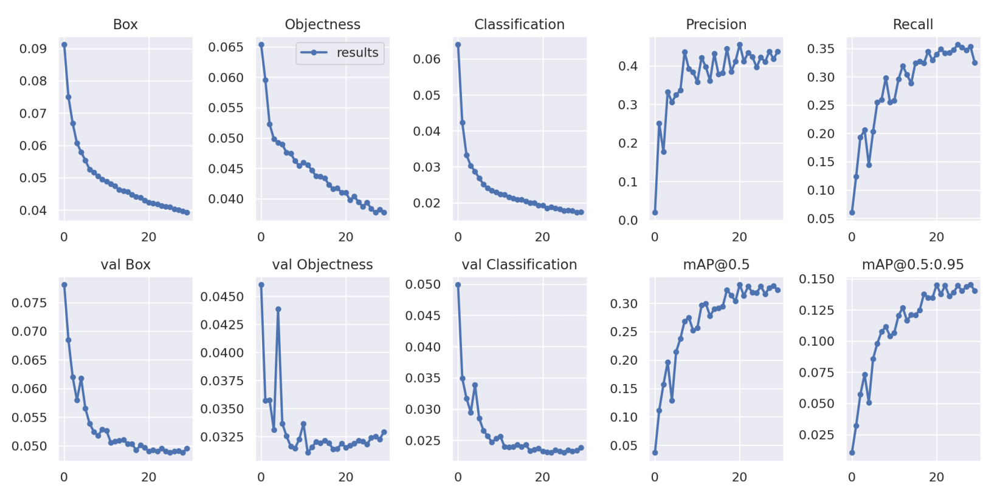

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/results.png'));

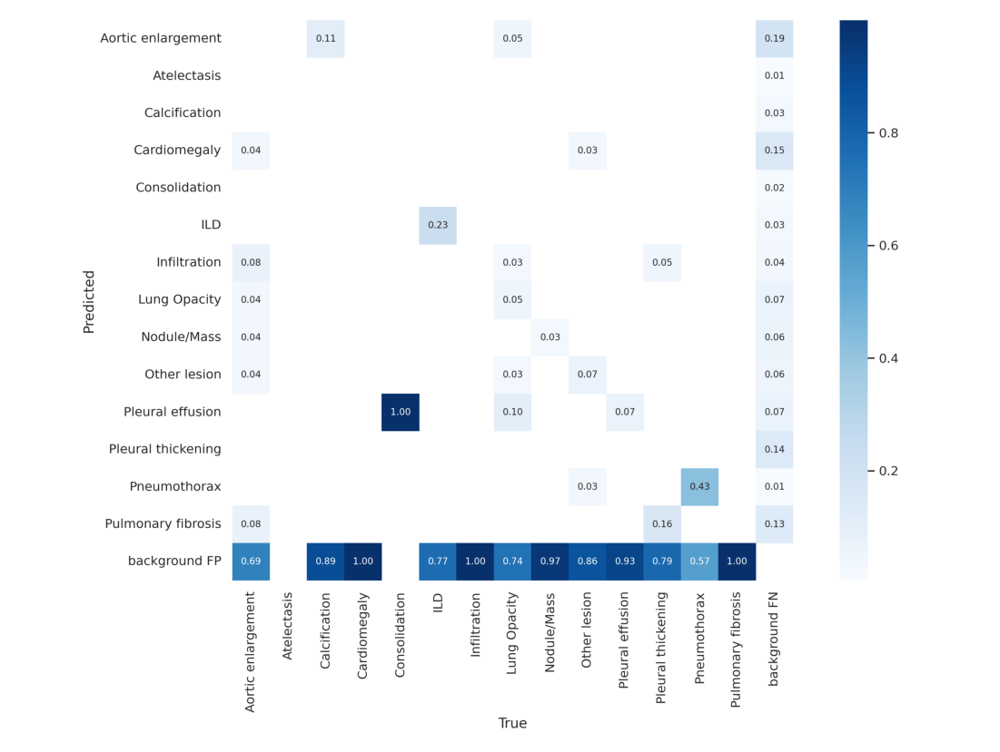

In [ ]:
plt.figure(figsize=(30,15))
plt.axis('off')
plt.imshow(plt.imread('runs/train/exp/confusion_matrix.png'));

# Predict TestCase

In [ ]:
%cd ..
%cd ..
%cd ..
%cd ..
!ls

/content/drive/.shortcut-targets-by-id/19WB1Ohri0T4iAv3l5rvluYoFBaNzInRN/Dataset/UTC2@iLabs_Training/Trong_Nhan/yolov5/runs/train/exp
/content/drive/.shortcut-targets-by-id/19WB1Ohri0T4iAv3l5rvluYoFBaNzInRN/Dataset/UTC2@iLabs_Training/Trong_Nhan/yolov5/runs/train
/content/drive/.shortcut-targets-by-id/19WB1Ohri0T4iAv3l5rvluYoFBaNzInRN/Dataset/UTC2@iLabs_Training/Trong_Nhan/yolov5/runs
/content/drive/.shortcut-targets-by-id/19WB1Ohri0T4iAv3l5rvluYoFBaNzInRN/Dataset/UTC2@iLabs_Training/Trong_Nhan/yolov5
data	    hubconf.py	__pycache__	  runs	    tutorial.ipynb  yolov5s.pt
detect.py   LICENSE	README.md	  test.py   utils	    yolov5x.pt
Dockerfile  models	requirements.txt  train.py  weights


In [ ]:
!python detect.py --weights 'runs/train/exp/weights/best.pt'  \
--img-size 640   \
--conf-thres 0.15 \
--iou 0.5   \
--source '/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/images/val'   \
--exist-ok

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.15, device='', exist_ok=True, img_size=640, iou_thres=0.5, name='exp', project='runs/detect', save_conf=False, save_txt=False, source='/content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbigdata/images/val', update=False, view_img=False, weights=['runs/train/exp/weights/best.pt'])
Using torch 1.10.1+cu111 CUDA:0 (Tesla T4, 15109.75MB)

Fusing layers... 
Model Summary: 484 layers, 88478091 parameters, 0 gradients
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
image 1/879 /content/drive/Shareddrives/Google Drive Unlimited/Data_Community_UTC2_@ILabs/UTC2@iLabs_Training/Trong_Nhan/vin512/vinbi

# Result in Test Case

100%|██████████| 16/16 [00:01<00:00, 14.03it/s]


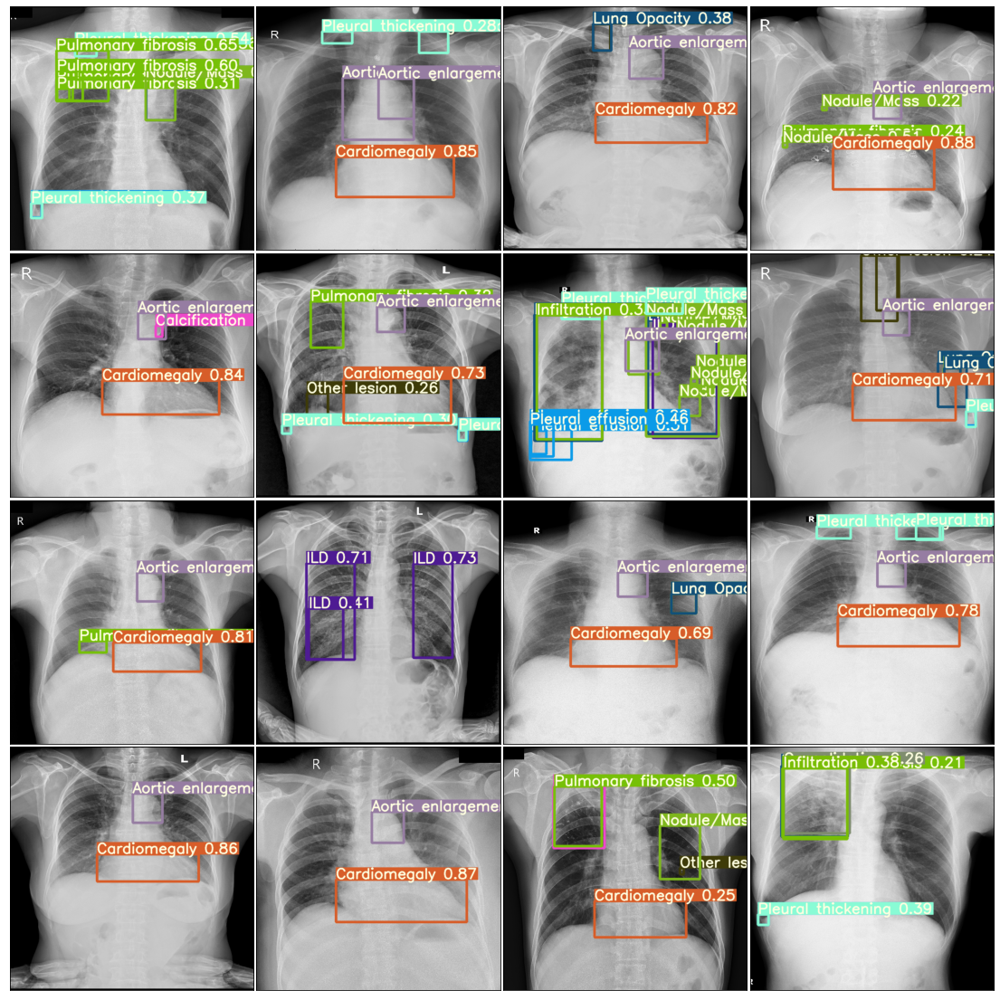

100%|██████████| 16/16 [00:00<00:00, 73.70it/s]


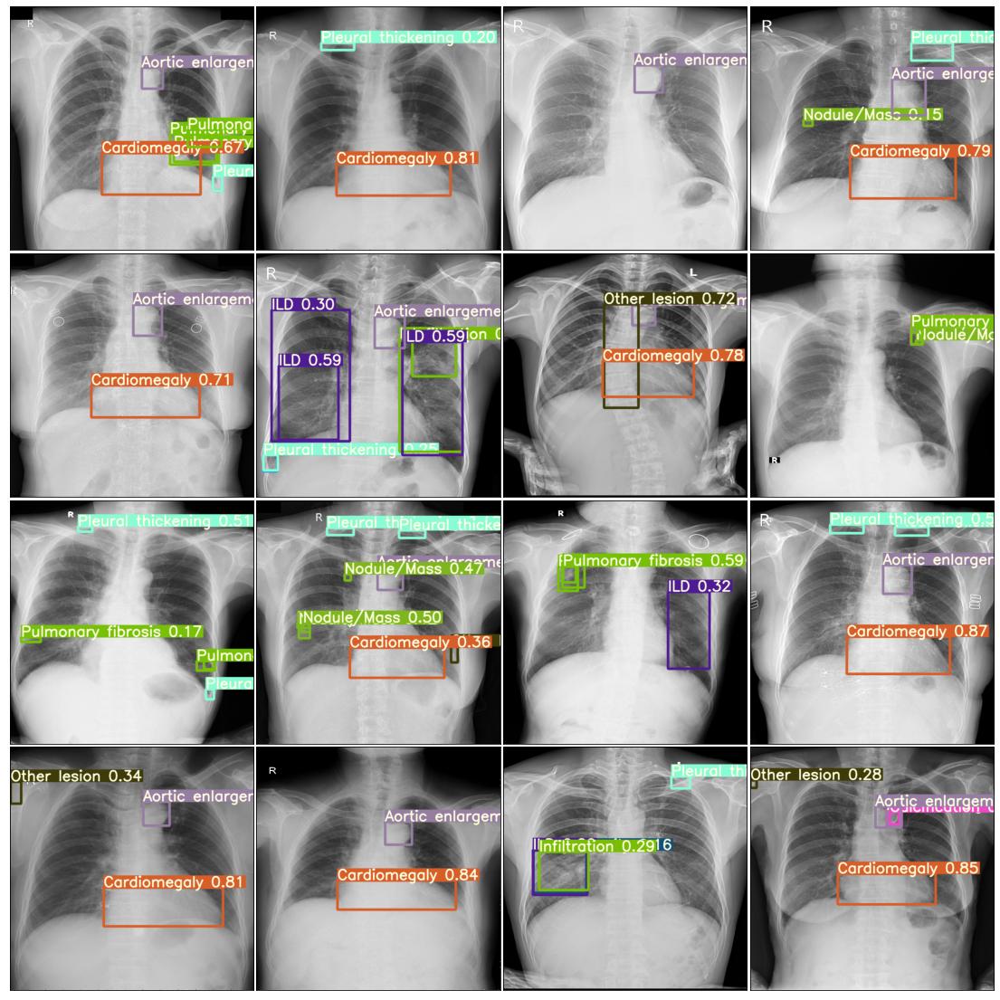

100%|██████████| 16/16 [00:00<00:00, 74.91it/s]


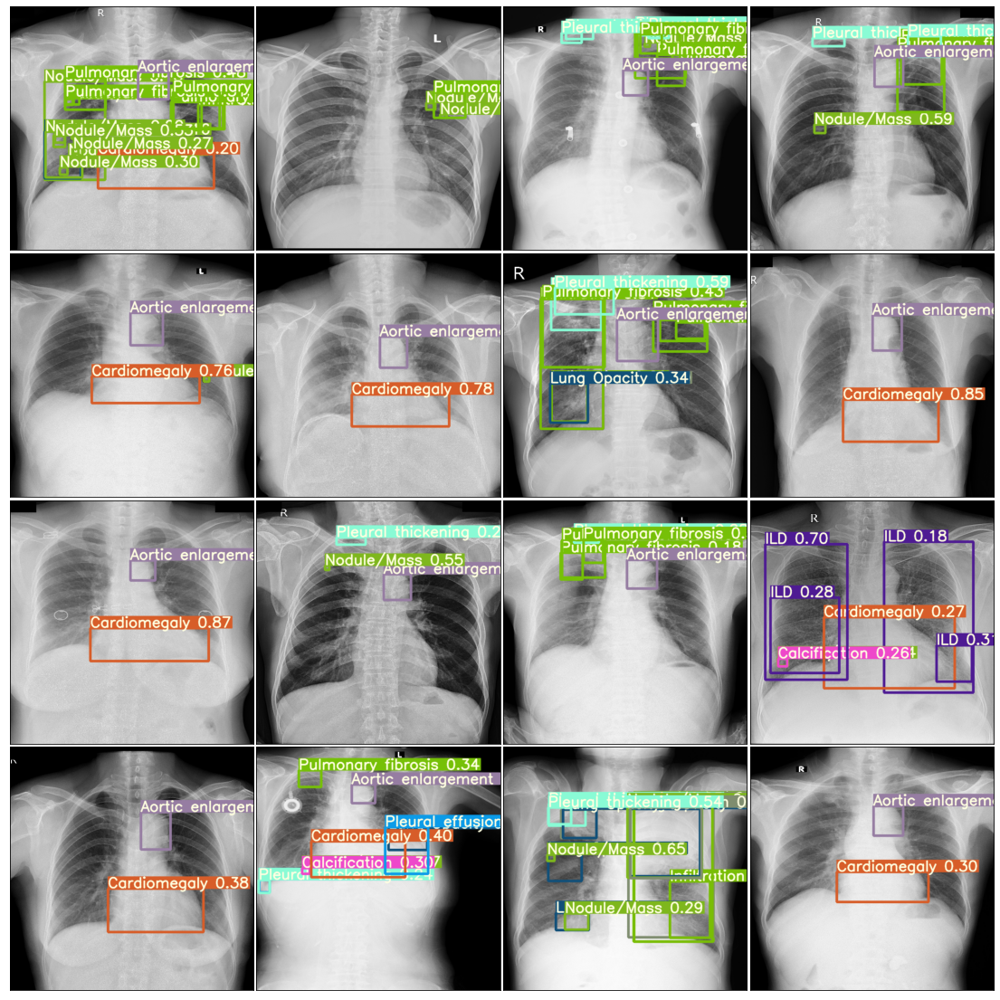

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import random
import cv2
from glob import glob
from tqdm import tqdm

files = glob('runs/detect/exp/*')
for _ in range(3):
    row = 4
    col = 4
    grid_files = random.sample(files, row*col)
    images     = []
    for image_path in tqdm(grid_files):
        img          = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        images.append(img)

    fig = plt.figure(figsize=(col*5, row*5))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(col, row),  # creates 2x2 grid of axes
                     axes_pad=0.05,  # pad between axes in inch.
                     )

    for ax, im in zip(grid, images):
        # Iterating over the grid returns the Axes.
        ax.imshow(im)
        ax.set_xticks([])
        ax.set_yticks([])
    plt.show()